<a href="https://colab.research.google.com/github/via-zhang/data-workshops/blob/main/wildfire_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Science for Sustainable Development
Workshop at the 2025 Student Sustainability Summit

Welcome to this workshop!
We will analyze fires in California, create interactive maps, and visualize fire impacts with satellite imagery.

Everything will be done in this Google Colab file. We will be coding in the Python programming language, which is commonly used by data scientists and researchers in various fields.

Data Sources:
- [California Department of Forestry and Fire Protection (CAL FIRE)](https://www.fire.ca.gov/incidents)
- [Sentinel-2 Satellite Imagery hosted by Planetary Computer](https://planetarycomputer.microsoft.com/dataset/sentinel-2-l2a)

## Part 1: California Fires

### Load & Format Data

In [ ]:
# Import packages

# General
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from datetime import timedelta

# Mapping
import geopandas as gpd
import folium
from shapely.geometry import Point
import matplotlib.pyplot as plt
from shapely.geometry import Point
!pip install contextily
import contextily as cx
!pip install mapclassify
import mapclassify

# Satellite
!pip install pystac-client
!pip install planetary_computer

from pystac.extensions.eo import EOExtension as eo
import pystac_client
import planetary_computer
from shapely import wkt
import rasterio
from rasterio import windows
from rasterio import features
from rasterio import warp

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 24.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.2/194.2 kB 7.7 MB/s eta 0:00:00


In [ ]:
# Load CAL FIRE dataset directly from the link
data = pd.read_csv('https://incidents.fire.ca.gov/imapdata/mapdataall.csv')

# View the data
data

,incident_name,incident_is_final,incident_date_last_update,incident_date_created,incident_administrative_unit,incident_administrative_unit_url,incident_county,incident_location,incident_acres_burned,incident_containment,...,incident_latitude,incident_type,incident_id,incident_url,incident_date_extinguished,incident_dateonly_extinguished,incident_dateonly_created,is_active,calfire_incident,notification_desired
0,Bridge Fire,Y,2018-01-09T13:46:00Z,2017-10-31T11:22:00Z,Shasta-Trinity National Forest,NaN,Shasta,"I-5 and Turntable Bay, 7 miles NE of Shasta Lake",37.0,100.0,...,40.774000,NaN,2ca11d45-8139-4c16-8af0-880d99b21e82,https://www.fire.ca.gov/incidents/2017/10/31/b...,2018-01-09T13:46:00Z,2018-01-09,2017-10-31,N,False,False
1,Pala Fire,Y,2020-09-16T14:07:35Z,2009-05-24T14:56:00Z,CAL FIRE San Diego Unit,NaN,San Diego,"Hwy 76 and Pala Temecula, northwest of Pala",122.0,100.0,...,1.000000,Wildfire,8f61f461-552d-4538-b186-35ab030da416,https://www.fire.ca.gov/incidents/2009/5/24/pa...,2009-05-25T00:00:00Z,2009-05-25,2009-05-24,N,True,False
2,River Fire,Y,2022-10-24T11:39:23Z,2013-02-24T08:16:00Z,CAL FIRE San Bernardino Unit,NaN,Inyo,"south of Narrow Gauge Rd & north of Hwy 136, e...",407.0,100.0,...,36.602575,NaN,094719ba-a47b-4abb-9ec5-a506b2b9fd23,https://www.fire.ca.gov/incidents/2013/2/24/ri...,2013-02-28T20:00:00Z,2013-02-28,2013-02-24,N,True,False
3,Fawnskin Fire,Y,2013-04-22T09:00:00Z,2013-04-20T17:30:00Z,San Bernardino National Forest,NaN,San Bernardino,"west of Delamar Mountain, north of the communi...",30.0,100.0,...,34.288877,NaN,58f89ff8-bd3e-4355-b1c0-8fa05c747d3f,https://www.fire.ca.gov/incidents/2013/4/20/fa...,2013-04-22T09:00:00Z,2013-04-22,2013-04-20,N,False,False
4,Gold Fire,Y,2013-05-01T07:00:00Z,2013-04-30T12:59:00Z,CAL FIRE Madera-Mariposa-Merced Unit,NaN,Madera,Between Road 210 and Road 200 near Fine Gold C...,274.0,100.0,...,37.116295,NaN,357ffc13-bef9-48eb-810f-c5de851972eb,https://www.fire.ca.gov/incidents/2013/4/30/go...,2013-05-01T07:00:00Z,2013-05-01,2013-04-30,N,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2834,Rosa Fire,Y,2025-01-30T08:30:36Z,2025-01-29T12:53:53Z,CAL FIRE San Luis Obispo Unit,NaN,San Luis Obispo,"Soda Lake Rd., San Luis Obispo County",105.0,100.0,...,35.303682,Wildfire,460e65e4-366e-46d1-8729-7d1756fca41a,https://www.fire.ca.gov/incidents/2025/1/29/ro...,2025-01-29T06:30:00Z,2025-01-29,2025-01-29,N,True,False
2835,Cross Fire,Y,2025-02-09T16:28:59Z,2025-02-09T13:47:06Z,CAL FIRE San Benito-Monterey Unit,NaN,Monterey,Near Cross Road in Lockwood,16.0,100.0,...,35.945458,Wildfire,6d86f896-f2e9-4189-b816-239b65f58d26,https://www.fire.ca.gov/incidents/2025/2/9/cro...,NaN,NaN,2025-02-09,N,True,False
2836,Eaton Flood,Y,2025-02-18T09:17:31Z,2025-02-13T13:51:16Z,Los Angeles County Fire Department,NaN,Los Angeles,"Near Altadena Drive and Midwick Drive, Altaden...",0.0,NaN,...,34.203871,Flood,d49b7509-2632-4153-8252-ec4de0e385ff,https://www.fire.ca.gov/incidents/2025/2/13/ea...,NaN,NaN,2025-02-13,N,False,False
2837,Penny Fire,Y,2025-02-27T17:04:03Z,2025-02-26T14:32:43Z,Cleveland National Forest,NaN,San Diego,"Sunrise Highway, North of Penny Pines Trailhead",9.0,NaN,...,32.922111,Wildfire,06a7c71b-03ff-4c7b-aff8-1d8bcf3c9def,https://www.fire.ca.gov/incidents/2025/2/26/pe...,2025-02-27T17:03:46Z,2025-02-27,2025-02-26,N,False,False


In [ ]:
# Display information about the columns - see what data we have to work with!
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2839 entries, 0 to 2838
Data columns (total 23 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   incident_name                     2839 non-null   object 
 1   incident_is_final                 2839 non-null   object 
 2   incident_date_last_update         2839 non-null   object 
 3   incident_date_created             2839 non-null   object 
 4   incident_administrative_unit      2783 non-null   object 
 5   incident_administrative_unit_url  0 non-null      float64
 6   incident_county                   2829 non-null   object 
 7   incident_location                 2839 non-null   object 
 8   incident_acres_burned             2786 non-null   float64
 9   incident_containment              2783 non-null   float64
 10  incident_control                  117 non-null    object 
 11  incident_cooperating_agencies     1660 non-null   object 
 12  incide

In [ ]:
# Format the date columns correctly (before, they were stored as 'object' types instead of dates)
data['incident_date_extinguished'] = pd.to_datetime(data['incident_date_extinguished'])
data['incident_dateonly_extinguished'] = pd.to_datetime(data['incident_dateonly_extinguished'])
data['incident_date_created'] = pd.to_datetime(data['incident_date_created'])
data['incident_dateonly_created'] = pd.to_datetime(data['incident_dateonly_created'])

# Filter the longitude and latitude to California (these coordinates were estimated based on Google Maps)
data = data[(data['incident_latitude'] > 32) &
            (data['incident_latitude'] < 42) &
            (data['incident_longitude'] > -124) &
            (data['incident_longitude'] < -114)]

# Make this dataset a GeoDataFrame, which stores information about the location of the points to make them easier to plot on a map
data = gpd.GeoDataFrame(data, geometry = gpd.points_from_xy(data['incident_longitude'], data['incident_latitude']), crs = 'EPSG:4326')

# Sort fire dataset by acres burned (in ascending order)
data = data.sort_values(by='incident_acres_burned', ascending=True)

### Map & Graph Data

In [ ]:
# Map the fires interactively
data.explore(column="incident_acres_burned",
             tooltip=["incident_name", "incident_dateonly_extinguished"],
             tooltip_kwds=dict(labels=False),
             popup=True,
             tiles="OpenStreetMap",
             cmap="YlOrRd_r",
             marker_kwds=dict(radius=5, fill=True),
             vmin=0,
             vmax=1000
)

Text(0.5, 1.0, 'California Wildfires (2013-2025)')

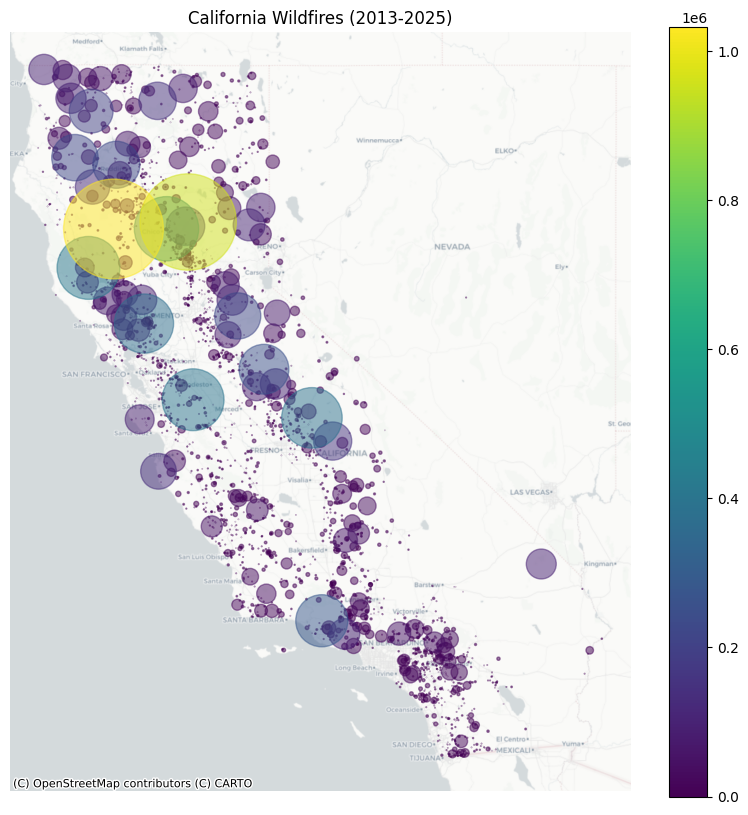

In [ ]:
# Map the fires statically
fig, ax = plt.subplots(figsize=(10, 10))

data.plot(ax=ax, column="incident_acres_burned",
               markersize=data['incident_acres_burned'] * 0.005,
               legend=True, alpha=0.5)
cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, crs=data.crs)
ax.set_axis_off()
ax.set_title("California Wildfires (2013-2025)")

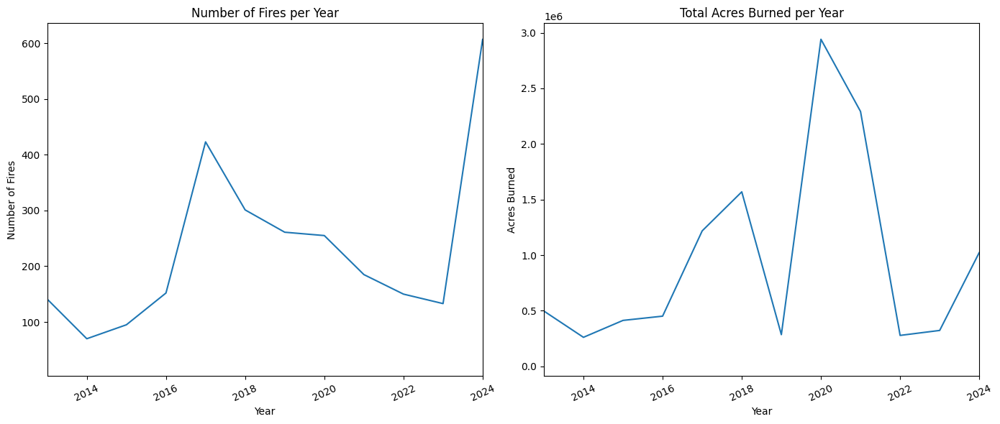

In [ ]:
# Plot the number of fires vs. acres burned per year
count = data.groupby(by=data['incident_dateonly_created'].dt.year)['incident_id'].count().reset_index()
count = count[count['incident_dateonly_created'] >= 2013]

# Create plot
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].plot(count['incident_dateonly_created'], count['incident_id'])
axes[0].set_title("Number of Fires per Year")
axes[0].set_xlabel("Year")
axes[0].set_ylabel("Number of Fires")
axes[0].set_xlim([2013, 2024])
axes[0].tick_params(axis='x', rotation=25)

acres = data.groupby(by=data['incident_dateonly_created'].dt.year)['incident_acres_burned'].sum().reset_index()
acres = acres[acres['incident_dateonly_created'] >= 2013]

axes[1].plot(acres['incident_dateonly_created'], acres['incident_acres_burned'])
axes[1].set_title("Total Acres Burned per Year")
axes[1].set_xlabel("Year")
axes[1].set_ylabel("Acres Burned")
axes[1].set_xlim([2013, 2024])
axes[1].tick_params(axis='x', rotation=25)

plt.tight_layout()
plt.show()

### View Before & After of Fires with Satellite Imagery

We will use the Planetary Computer STAC API to load satellite imagery - without needing to download anything! [Learn more here](https://planetarycomputer.microsoft.com/dataset/sentinel-2-l2a#Example-Notebook).

In [ ]:
# List the 10 most recent fires where the acres burned was more than 100
data[data['incident_acres_burned'] > 100].sort_values(by='incident_date_created', ascending=False).head(10)

,incident_name,incident_is_final,incident_date_last_update,incident_date_created,incident_administrative_unit,incident_administrative_unit_url,incident_county,incident_location,incident_acres_burned,incident_containment,...,incident_type,incident_id,incident_url,incident_date_extinguished,incident_dateonly_extinguished,incident_dateonly_created,is_active,calfire_incident,notification_desired,geometry
2834,Rosa Fire,Y,2025-01-30T08:30:36Z,2025-01-29 12:53:53+00:00,CAL FIRE San Luis Obispo Unit,NaN,San Luis Obispo,"Soda Lake Rd., San Luis Obispo County",105.0,100.0,...,Wildfire,460e65e4-366e-46d1-8729-7d1756fca41a,https://www.fire.ca.gov/incidents/2025/1/29/ro...,2025-01-29 06:30:00+00:00,2025-01-29,2025-01-29,N,True,False,POINT (-119.98252 35.30368)
2831,Border 2 Fire,Y,2025-01-30T22:10:30Z,2025-01-23 13:58:00+00:00,Unified Command: CAL FIRE San Diego Unit & San...,NaN,San Diego,"Otay Mountain Wilderness, Northwest aspect of ...",6625.0,100.0,...,Wildfire,a9719e0a-db5d-48d4-895c-5b096ae1802d,https://www.fire.ca.gov/incidents/2025/1/23/bo...,NaT,NaT,2025-01-23,N,True,False,POINT (-116.8437 32.5947)
2828,Hughes Fire,Y,2025-01-30T22:10:52Z,2025-01-22 10:53:02+00:00,"Unified Command: CAL FIRE, Angeles National Fo...",NaN,Los Angeles,"Lake Hughes Road near Castaic Lake, Castaic",10425.0,100.0,...,Wildfire,bf194e6a-78cb-46bc-849b-567bceaabbb6,https://www.fire.ca.gov/incidents/2025/1/22/hu...,NaT,NaT,2025-01-22,N,True,False,POINT (-118.56687 34.55301)
2817,Kenneth Fire,Y,2025-01-12T07:48:29Z,2025-01-09 15:34:13+00:00,Unified Command: Los Angeles City Fire Departm...,NaN,"Los Angeles, Ventura","Victory Boulevard west of Gilmore Street, West...",1052.0,100.0,...,Wildfire,98dad47e-805e-4300-8220-c908df687b4b,https://www.fire.ca.gov/incidents/2025/1/9/ken...,2025-01-12 07:48:12+00:00,2025-01-12,2025-01-09,N,False,False,POINT (-118.66991 34.1852)
2815,Lidia Fire,Y,2025-01-11T07:41:52Z,2025-01-08 14:07:38+00:00,Unified Command: Angeles National Forest and L...,NaN,Los Angeles,"5700 Block of Soledad Canyon Road, Acton",395.0,100.0,...,Wildfire,83adc92b-bd6c-458a-a2b1-43b3ee2c27b3,https://www.fire.ca.gov/incidents/2025/1/8/lid...,2025-01-11 07:40:17+00:00,2025-01-11,2025-01-08,N,False,False,POINT (-118.2433 34.4408)
2811,Hurst Fire,Y,2025-01-16T21:51:53Z,2025-01-07 22:29:30+00:00,"Los Angeles City Fire Department, United State...",NaN,Los Angeles,"Near Diamond Road, Sylmar",799.0,100.0,...,Wildfire,ed36cf94-75d8-43f6-913a-d15646907311,https://www.fire.ca.gov/incidents/2025/1/7/hur...,2025-01-16 00:00:00+00:00,2025-01-16,2025-01-07,N,False,False,POINT (-118.47813 34.32533)
2810,Eaton Fire,Y,2025-03-04T15:03:07Z,2025-01-07 18:18:00+00:00,Los Angeles County Fire Department,NaN,Los Angeles,"Near Altadena Drive and Midwick Drive, Altaden...",14021.0,100.0,...,Wildfire,dbfa574e-1b10-4467-b5e5-7d1c06ebc8dc,https://www.fire.ca.gov/incidents/2025/1/7/eat...,2025-01-31 10:48:42+00:00,2025-01-31,2025-01-07,N,True,False,POINT (-118.06916 34.20348)
2809,Palisades Fire,Y,2025-03-04T15:02:18Z,2025-01-07 10:30:00+00:00,Los Angeles City Fire Department,NaN,Los Angeles,"Southeast of Palisades Drive, Pacific Palisades",23707.0,100.0,...,Wildfire,abfed7a3-794a-4294-9852-43176dcbc18a,https://www.fire.ca.gov/incidents/2025/1/7/pal...,2025-01-31 10:48:30+00:00,2025-01-31,2025-01-07,N,True,False,POINT (-118.54453 34.07022)
2806,Soda Fire,Y,2024-12-23T08:53:03Z,2024-12-21 04:49:00+00:00,Bureau of Land Management,NaN,"Kern, San Luis Obispo","Soda Lake Road and Pipeline Road, San Luis Obispo",419.0,100.0,...,Wildfire,c991981e-892b-449a-b467-b5f742a4e9b1,https://www.fire.ca.gov/incidents/2024/12/21/s...,NaT,NaT,2024-12-21,N,False,False,POINT (-119.477 34.9868)
2802,Franklin Fire,Y,2025-01-06T16:22:51Z,2024-12-09 22:50:53+00:00,"Unified Command: CAL FIRE IMT 4, Los Angeles C...",NaN,Los Angeles,"Malibu Canyon Road, Malibu Creek State Park",4037.0,100.0,...,Wildfire,54e9ee49-0c28-4477-8c29-b46738b07b78,https://www.fire.ca.gov/incidents/2024/12/9/fr...,2024-12-18 20:59:13+

In [ ]:
def square_poly(longitude, latitude, distance):
  """
  Inputs: longitude and latitude (EPSG:4326) and distance (meters)
  Output: square polygon that is centered at the input coordinates
  """
  gs = gpd.GeoSeries(wkt.loads(f'POINT ({longitude} {latitude})'))
  gdf = gpd.GeoDataFrame(geometry=gs)
  gdf.crs='EPSG:4326'
  gdf = gdf.to_crs('EPSG:32617')
  res = gdf.buffer(
      distance=distance,
      cap_style='square',
  )
  return res.to_crs('EPSG:4326').iloc[0]

In [ ]:
# Connect to Planetary Computer
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

def get_satellite_data(fire_name, buffer_distance, buffer_days):
  """
  Search Planetary Computer for Sentinel-2 satellite imagery from before and
  after the fire.
  Inputs:
  - fire_name (str): the name of the fire matching the CAL FIRE data
  - buffer_distance (int): distance (meters) around the recorded fire point to crop the satellite image
  - buffer_days (int): length (days) before and after the fire record date to search for satellite images
  Output:
  - before_asset_href and after_asset_href: URL to the Cloud Optimized GeoTIFF before and after the fire, respectively
  - area_of_interest: the buffer distance around the fire point (helpful for displaying the image)
  """
  # Get fire data (if there are multiple fires with same name, gets most recent one)
  fire_data = data[data['incident_name'] == fire_name].sort_values(by='incident_date_created', ascending=False).iloc[0]
  fire_lon = fire_data['incident_longitude']
  fire_lat = fire_data['incident_latitude']

  # Get fire date and use it to define a time range
  fire_date = fire_data['incident_dateonly_created'].date()
  search_start = str(fire_date - timedelta(days = buffer_days))
  search_end = str(fire_date + timedelta(days = buffer_days))
  fire_date = str(fire_date)
  print(f"{fire_name} record created on {fire_date}. Searching satellite images from {search_start} to {search_end}")

  # Define time range; we will search for satellite images taken between these dates
  before_fire = f"{search_start}/{fire_date}"
  after_fire = f"{fire_date}/{search_end}"

  area_of_interest = {
      "type": "Polygon",
      "coordinates": [
          [list(coord) for coord in square_poly(fire_lon, fire_lat, buffer_distance).exterior.coords]
      ],
  }

  ##### Before fire #####
  search = catalog.search(
      collections=["sentinel-2-l2a"],
      intersects=area_of_interest,
      datetime=before_fire,
      query={"eo:cloud_cover": {"lt": 10}},
  )

  # Check how many images were returned
  items = search.item_collection()
  print(f"Before fire: Returned {len(items)} satellite images.")

  # Get least cloudy image
  least_cloudy_item = min(items, key=lambda item: eo.ext(item).cloud_cover)

  print(
      f"Choosing {least_cloudy_item.id} from {least_cloudy_item.datetime.date()}"
      f" with {eo.ext(least_cloudy_item).cloud_cover}% cloud cover"
  )
  before_asset_href = least_cloudy_item.assets["visual"].href

  ##### After fire #####
  search = catalog.search(
      collections=["sentinel-2-l2a"],
      intersects=area_of_interest,
      datetime=after_fire,
      query={"eo:cloud_cover": {"lt": 10}},
  )

  # Check how many images were returned
  items = search.item_collection()
  print(f"After fire: Returned {len(items)} satellite images.")

  # Get least cloudy image
  least_cloudy_item = min(items, key=lambda item: eo.ext(item).cloud_cover)

  print(
      f"Choosing {least_cloudy_item.id} from {least_cloudy_item.datetime.date()}"
      f" with {eo.ext(least_cloudy_item).cloud_cover}% cloud cover"
  )
  after_asset_href = least_cloudy_item.assets["visual"].href

  return before_asset_href, after_asset_href, area_of_interest

def read_satellite_data(asset_href, area_of_interest):
  """
  Inputs:
  - asset_href: URL to Cloud Optimized GeoTIFF
  - area_of_interest: polygon corresponding to asset_href
  Output: image
  """
  with rasterio.open(asset_href) as ds:
    aoi_bounds = features.bounds(area_of_interest)
    warped_aoi_bounds = warp.transform_bounds("epsg:4326", ds.crs, *aoi_bounds)
    aoi_window = windows.from_bounds(transform=ds.transform, *warped_aoi_bounds)
    band_data = ds.read(window=aoi_window)

  img = Image.fromarray(np.transpose(band_data, axes=[1, 2, 0]))
  w = img.size[0]
  h = img.size[1]
  aspect = w / h
  target_w = 800
  target_h = (int)(target_w / aspect)
  img.resize((target_w, target_h), Image.Resampling.BILINEAR)
  return img

def plot_fire_impact(fire_name, buffer_distance, buffer_days):
  """
  Combining the get_satellite_data and read_satellite_data functions,
  this function gets the data and displays the before and after satellite images.
  """
  before_asset_href, after_asset_href, area_of_interest = get_satellite_data(fire_name, buffer_distance, buffer_days)

  before_s2 = read_satellite_data(before_asset_href, area_of_interest)
  after_s2 = read_satellite_data(after_asset_href, area_of_interest)

  # Create figure
  fig, axes = plt.subplots(1, 2, figsize=(12, 6))

  axes[0].imshow(before_s2)
  axes[0].axis('off')
  axes[0].set_title(f'Before {fire_name}')

  axes[1].imshow(after_s2)
  axes[1].axis('off')
  axes[1].set_title(f'After {fire_name}')

  plt.tight_layout()
  plt.show()

Rosa Fire record created on 2025-01-29. Searching satellite images from 2024-12-30 to 2025-02-28
Before fire: Returned 8 satellite images.
Choosing S2B_MSIL2A_20250110T184649_R070_T11SKV_20250110T223204 from 2025-01-10 with 0.001493% cloud cover
After fire: Returned 1 satellite images.
Choosing S2B_MSIL2A_20250130T184529_R070_T11SKV_20250130T234441 from 2025-01-30 with 3.882685% cloud cover


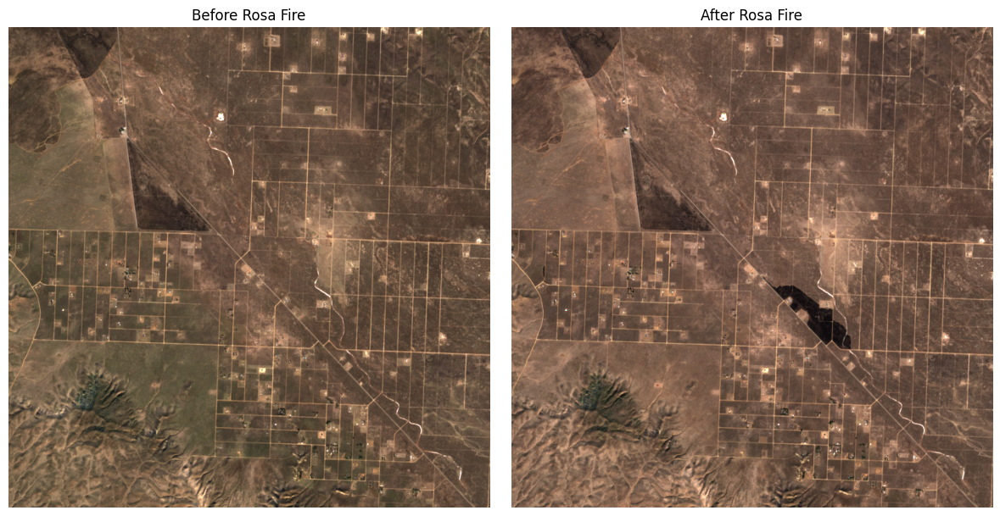

In [ ]:
plot_fire_impact('Rosa Fire', 3000, 30)

Border 2 Fire record created on 2025-01-23. Searching satellite images from 2024-12-24 to 2025-02-22
Before fire: Returned 7 satellite images.
Choosing S2A_MSIL2A_20250102T183751_R027_T11SNS_20250102T221646 from 2025-01-02 with 0.027034% cloud cover
After fire: Returned 2 satellite images.
Choosing S2C_MSIL2A_20250221T183421_R027_T11SNS_20250222T001111 from 2025-02-21 with 0.001462% cloud cover


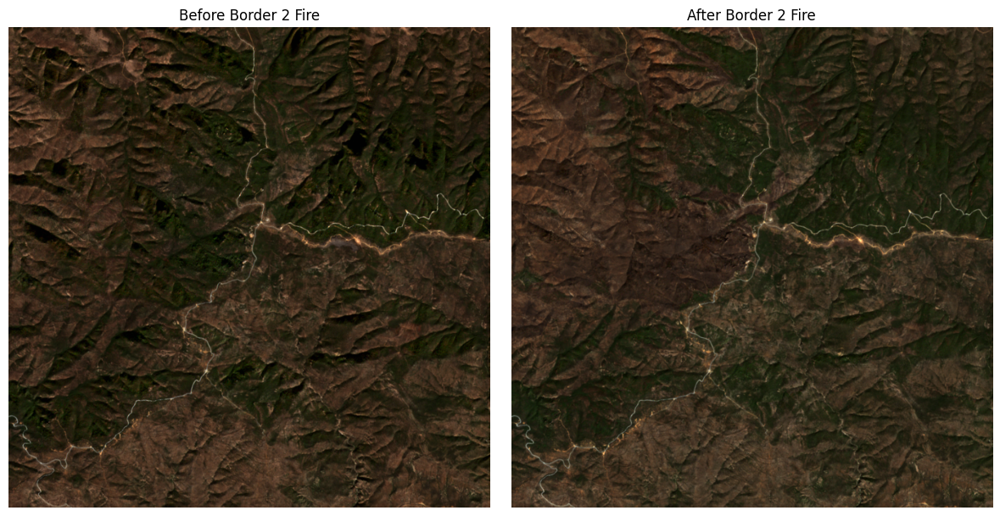

In [ ]:
plot_fire_impact('Border 2 Fire', 3000, 30)

Franklin Fire record created on 2024-12-09. Searching satellite images from 2024-11-09 to 2025-01-08
Before fire: Returned 3 satellite images.
Choosing S2A_MSIL2A_20241113T183621_R027_T11SLT_20241113T223000 from 2024-11-13 with 0.005869% cloud cover
After fire: Returned 2 satellite images.
Choosing S2B_MSIL2A_20241218T183709_R027_T11SLT_20241218T222347 from 2024-12-18 with 0.004997% cloud cover


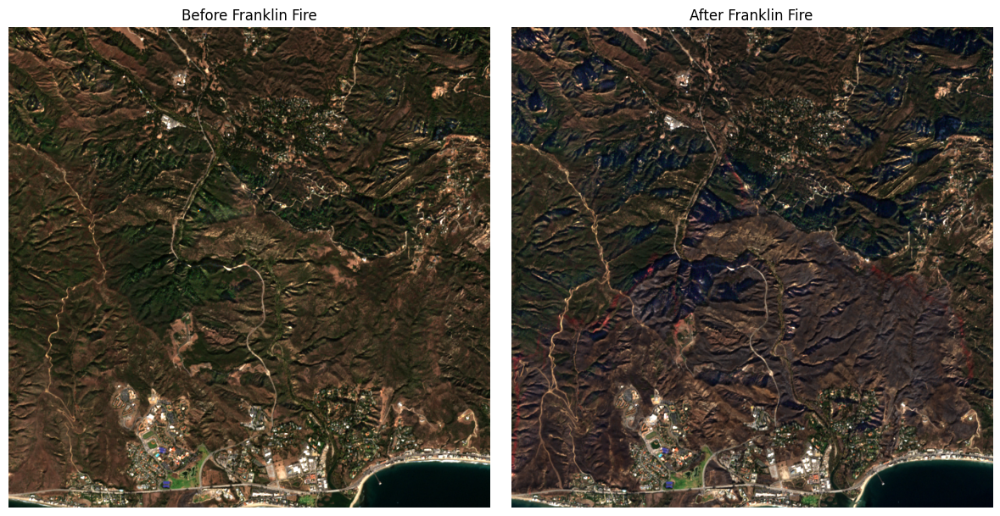

In [ ]:
plot_fire_impact('Franklin Fire', 3000, 30)